In [1]:
# loading in and transforming data
import os
import torch
from torch.utils.data import DataLoader
import torchvision
import torchvision.datasets as datasets
import torchvision.transforms as transforms

# visualizing data
import matplotlib.pyplot as plt
import numpy as np
import warnings

%matplotlib inline

In [2]:
from google.colab import drive
drive.mount("/content/gdrive")

Mounted at /content/gdrive


In [3]:
import zipfile
zip_ref = zipfile.ZipFile("/content/gdrive/MyDrive/monet2photo.zip", "r")
zip_ref.extractall("./dataset")
zip_ref.close()

In [5]:
def get_data_loader(image_type, image_dir='/content/dataset/monet2photo', 
                    image_size=256, batch_size=16, num_workers=0):
    """Returns training and test data loaders for a given image type, either 'monet' or 'photo'. 
       These images will be resized to 256x256x3, by default, converted into Tensors, and normalized.
    """
    
    # resize and normalize the images
    transform = transforms.Compose([transforms.Resize(image_size), # resize to 256x256
                                    transforms.ToTensor()])

    # get training and test directories
    image_path = image_dir
    train_path = os.path.join(image_path, image_type)
    test_path = os.path.join(image_path, 'test_{}'.format(image_type))

    # define datasets using ImageFolder
    train_dataset = datasets.ImageFolder(train_path, transform)
    test_dataset = datasets.ImageFolder(test_path, transform)

    # create and return DataLoaders
    train_loader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers)
    test_loader = DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)

    return train_loader, test_loader

In [6]:
dataloader_X, test_dataloader_X = get_data_loader(image_type='monet')
dataloader_Y, test_dataloader_Y = get_data_loader(image_type='photo')

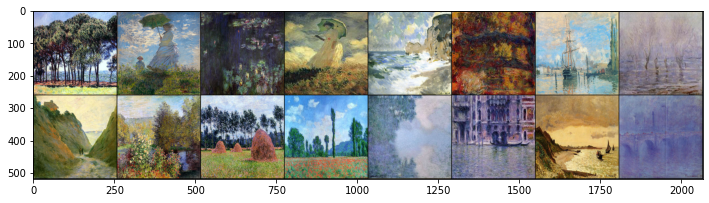

In [7]:
def imshow(img):
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    
# get some images from X
dataiter = iter(dataloader_X)
# the "_" is a placeholder for no labels
images, _ = dataiter.next()

# show images
fig = plt.figure(figsize=(12, 8))
imshow(torchvision.utils.make_grid(images))

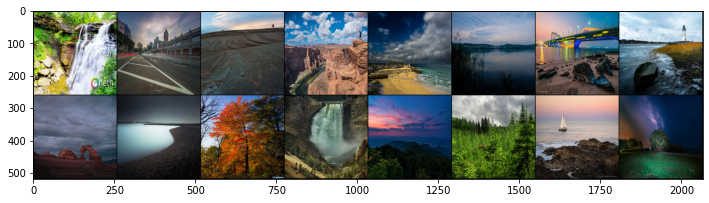

In [8]:
# get some images from Y
dataiter = iter(dataloader_Y)
images, _ = dataiter.next()

# show images
fig = plt.figure(figsize=(12,8))
imshow(torchvision.utils.make_grid(images))

In [9]:
# current range
img = images[0]

print('Min: ', img.min())
print('Max: ', img.max())

Min:  tensor(0.)
Max:  tensor(1.)


In [13]:
# helper scale function
def scale(x, feature_range=(-1, 1)):
    min, max = feature_range
    x = x * (max - min) + min
    return x

In [11]:
# scaled range
scaled_img = scale(img)
print('Scaled min: ', scaled_img.min())
print('Scaled max: ', scaled_img.max())

Scaled min:  tensor(-1.)
Scaled max:  tensor(1.)


In [12]:
import torch.nn as nn
import torch.nn.functional as F
def conv(in_channels, out_channels, kernel_size, stride=2, padding=1, batch_norm=True):
    #Creates a convolutional layer, with optional batch normalization.
    layers = []
    conv_layer = nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=kernel_size, stride=stride, padding=padding, bias=False)
    nn.init.xavier_uniform(conv_layer.weight)
    layers.append(conv_layer)
    if batch_norm:
        layers.append(nn.BatchNorm2d(out_channels))
    return nn.Sequential(*layers)

In [14]:
class Discriminator(nn.Module):
    def __init__(self, conv_dim=64):
        super(Discriminator, self).__init__()
        # Define convolutional layers increasing in depth
        # Should accept an RGB image as input and output a single value
        # first layer has no batchnorm
        self.conv1 = conv(3, 64, 4, batch_norm=False) # (128,128,64)
        self.conv2 = conv(64, 128, 4) # (64, 64, 128)
        self.conv3 = conv(128, 256, 4) # (32, 32, 256)
        self.conv4 = conv(256, 512, 4) # (16, 16, 512)
        # Classification layer again has no batchnorm
        self.conv5 = conv(512, 1, 4, stride=1,batch_norm=False)

    def forward(self, x):
        # leaky_relu applied to all conv layers but last
        out = F.leaky_relu(self.conv1(x),negative_slope=0.2)
        out = F.leaky_relu(self.conv2(out),negative_slope=0.2)
        out = F.leaky_relu(self.conv3(out),negative_slope=0.2)
        out = F.leaky_relu(self.conv4(out),negative_slope=0.2)
        # last, classification layer
        out = self.conv5(out)
        return out

In [15]:
# residual block class
class ResidualBlock(nn.Module):
    def __init__(self, conv_dim):
        super(ResidualBlock, self).__init__()
        # conv_dim = number of inputs
        # define two convolutional layers + batch normalization that will act as our residual function, F(x)
        # layers should have the same shape input as output
        self.conv_layer1 = conv(in_channels=conv_dim, out_channels=conv_dim, kernel_size=3, stride=1, padding=1, batch_norm=True)
        self.conv_layer2 = conv(in_channels=conv_dim, out_channels=conv_dim, kernel_size=3, stride=1, padding=1, batch_norm=True)
        
    def forward(self, x):
        # apply a ReLu activation the outputs of the first layer
        # return a summed output, x + resnet_block(x)
        out_1 = F.relu(self.conv_layer1(x))
        out_2 = x + self.conv_layer2(out_1)
        return out_2

In [16]:
#deconv function
def deconv(in_channels, out_channels, kernel_size, stride=2, padding=1, batch_norm=True):
    layers = []
    # append transpose conv layer
    layers.append(nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding, bias=False))
    # optional batch norm layer
    if batch_norm:
        layers.append(nn.BatchNorm2d(out_channels))
    return nn.Sequential(*layers)

In [17]:
class CycleGenerator(nn.Module):
    def __init__(self, conv_dim=64, n_res_blocks=6):
        super(CycleGenerator, self).__init__()
        # 1. Define the encoder part of the generator
        # initial convolutional layer
        self.conv1 = conv(3, conv_dim, 4)
        self.conv2 = conv(conv_dim, conv_dim*2, 4)
        self.conv3 = conv(conv_dim*2, conv_dim*4, 4)

        # 2. Define the resnet part of the generator
        # Residual blocks
        res_layers = []
        for layer in range(n_res_blocks):
            res_layers.append(ResidualBlock(conv_dim*4))
        # use sequential to create these layers
        self.res_blocks = nn.Sequential(*res_layers)

        # 3. Define the decoder part of the generator
        # two transpose convolutional layers and a third that looks a lot like the initial conv layer
        self.deconv1 = deconv(conv_dim*4, conv_dim*2, 4)
        self.deconv2 = deconv(conv_dim*2, conv_dim, 4)
        # no batch norm on last layer
        self.deconv3 = deconv(conv_dim, 3, 4, batch_norm=False)

    def forward(self, x):
        #Given an image x, returns a transformed image.
        out = F.relu(self.conv1(x))
        out = F.relu(self.conv2(out))
        out = F.relu(self.conv3(out))
        out = self.res_blocks(out)
        out = F.relu(self.deconv1(out))
        out = F.relu(self.deconv2(out))
        # tanh applied to last layer
        out = F.tanh(self.deconv3(out))

        return out

In [19]:
def create_model(g_conv_dim=64, d_conv_dim=64, n_res_blocks=6):
    # Instantiate generators
    G_XtoY = CycleGenerator(conv_dim=g_conv_dim, n_res_blocks=n_res_blocks)
    G_YtoX = CycleGenerator(conv_dim=g_conv_dim, n_res_blocks=n_res_blocks)
    # Instantiate discriminators
    D_X = Discriminator(conv_dim=d_conv_dim)
    D_Y = Discriminator(conv_dim=d_conv_dim)
    # move models to GPU, if available
    if torch.cuda.is_available():
        device = torch.device("cuda:0")
        G_XtoY.to(device)
        G_YtoX.to(device)
        D_X.to(device)
        D_Y.to(device)
        print('Models moved to GPU.')
    else:
        print('Only CPU available.')

    return G_XtoY, G_YtoX, D_X, D_Y

In [20]:
# call the function to get models
G_XtoY, G_YtoX, D_X, D_Y = create_model()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  import sys


Models moved to GPU.


In [21]:
def print_models(G_XtoY, G_YtoX, D_X, D_Y):
    """Prints model information for the generators and discriminators.
    """
    print("                     G_XtoY                    ")
    print("-----------------------------------------------")
    print(G_XtoY)
    print()

    print("                     G_YtoX                    ")
    print("-----------------------------------------------")
    print(G_YtoX)
    print()

    print("                      D_X                      ")
    print("-----------------------------------------------")
    print(D_X)
    print()

    print("                      D_Y                      ")
    print("-----------------------------------------------")
    print(D_Y)
    print()

# print all of the models
print_models(G_XtoY, G_YtoX, D_X, D_Y)

                     G_XtoY                    
-----------------------------------------------
CycleGenerator(
  (conv1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv3): Sequential(
    (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (res_blocks): Sequential(
    (0): ResidualBlock(
      (conv_layer1): Sequential(
        (0): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
   

In [22]:
def real_mse_loss(D_out):
    # how close is the produced output from being "real"?
    return torch.mean((D_out-1)**2)

def fake_mse_loss(D_out):
    # how close is the produced output from being "fake"?
    return torch.mean(D_out**2)

def cycle_consistency_loss(real_im, reconstructed_im, lambda_weight):
    # calculate reconstruction loss 
    reconstr_loss = torch.mean(torch.abs(real_im - reconstructed_im))
    # return weighted loss
    return lambda_weight*reconstr_loss

In [23]:
import torch.optim as optim
# hyperparams for Adam optimizer
lr=0.0001
beta1=0.6
beta2=0.999 # default value
g_params = list(G_XtoY.parameters()) + list(G_YtoX.parameters())  # Get generator parameters
# Create optimizers for the generators and discriminators
g_optimizer = optim.Adam(g_params, lr, [beta1, beta2])
d_x_optimizer = optim.Adam(D_X.parameters(), lr, [beta1, beta2])
d_y_optimizer = optim.Adam(D_Y.parameters(), lr, [beta1, beta2])

In [24]:
import pdb
import pickle
import argparse
warnings.filterwarnings("ignore")
import torch
import scipy
import imageio

if not os.path.exists('samples_cyclegan'):
    os.makedirs('samples_cyclegan')

def checkpoint(iteration, G_XtoY, G_YtoX, D_X, D_Y, checkpoint_dir='checkpoints_cyclegan'):
    """Saves the parameters of both generators G_YtoX, G_XtoY and discriminators D_X, D_Y.
        """
    G_XtoY_path = os.path.join(checkpoint_dir, 'G_XtoY.pkl')
    G_YtoX_path = os.path.join(checkpoint_dir, 'G_YtoX.pkl')
    D_X_path = os.path.join(checkpoint_dir, 'D_X.pkl')
    D_Y_path = os.path.join(checkpoint_dir, 'D_Y.pkl')
    torch.save(G_XtoY.state_dict(), G_XtoY_path)
    torch.save(G_YtoX.state_dict(), G_YtoX_path)
    torch.save(D_X.state_dict(), D_X_path)
    torch.save(D_Y.state_dict(), D_Y_path)


def merge_images(sources, targets, batch_size=16):
    """Creates a grid consisting of pairs of columns, where the first column in
        each pair contains images source images and the second column in each pair
        contains images generated by the CycleGAN from the corresponding images in
        the first column.
        """
    _, _, h, w = sources.shape
    row = int(np.sqrt(batch_size))
    merged = np.zeros([3, row*h, row*w*2])
    for idx, (s, t) in enumerate(zip(sources, targets)):
        i = idx // row
        j = idx % row
        merged[:, i*h:(i+1)*h, (j*2)*h:(j*2+1)*h] = s
        merged[:, i*h:(i+1)*h, (j*2+1)*h:(j*2+2)*h] = t
    merged = merged.transpose(1, 2, 0)
    return merged
    

def to_data(x):
    """Converts variable to numpy."""
    if torch.cuda.is_available():
        x = x.cpu()
    x = x.data.numpy()
    x = ((x +1)*255 / (2)).astype(np.uint8) # rescale to 0-255
    return x

def save_samples(iteration, fixed_Y, fixed_X, G_YtoX, G_XtoY, batch_size=16, sample_dir='samples_cyclegan'):
    """Saves samples from both generators X->Y and Y->X.
        """
    # move input data to correct device
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

    fake_X = G_YtoX(fixed_Y.to(device))
    fake_Y = G_XtoY(fixed_X.to(device))
    
    X, fake_X = to_data(fixed_X), to_data(fake_X)
    Y, fake_Y = to_data(fixed_Y), to_data(fake_Y)
    
    merged = merge_images(X, fake_Y, batch_size)
    path = os.path.join(sample_dir, 'sample-{:06d}-X-Y.png'.format(iteration))
    imageio.imwrite(path, merged)
    print('Saved {}'.format(path))
    
    merged = merge_images(Y, fake_X, batch_size)
    path = os.path.join(sample_dir, 'sample-{:06d}-Y-X.png'.format(iteration))
    imageio.imwrite(path, merged)
    print('Saved {}'.format(path))

In [25]:
def training_loop(dataloader_X, dataloader_Y, test_dataloader_X, test_dataloader_Y, 
                  n_epochs=1000):
    
    print_every=10
    # keep track of losses over time
    losses = []
    
    test_iter_X = iter(test_dataloader_X)
    test_iter_Y = iter(test_dataloader_Y)

    # Get some fixed data from domains X and Y for sampling. These are images that are held
    # constant throughout training, that allow us to inspect the model's performance.
    fixed_X = test_iter_X.next()[0]
    fixed_Y = test_iter_Y.next()[0]
    fixed_X = scale(fixed_X) # make sure to scale to a range -1 to 1
    fixed_Y = scale(fixed_Y)

    # batches per epoch
    iter_X = iter(dataloader_X)
    iter_Y = iter(dataloader_Y)
    batches_per_epoch = min(len(iter_X), len(iter_Y))

    for epoch in range(1, n_epochs+1):
        # Reset iterators for each epoch
        if epoch % batches_per_epoch == 0:
            iter_X = iter(dataloader_X)
            iter_Y = iter(dataloader_Y)

        images_X, _ = iter_X.next()
        images_X = scale(images_X) # make sure to scale to a range -1 to 1

        images_Y, _ = iter_Y.next()
        images_Y = scale(images_Y)
        # move images to GPU if available (otherwise stay on CPU)
        device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        images_X = images_X.to(device)
        images_Y = images_Y.to(device)

        #Train the discriminators#
        d_x_optimizer.zero_grad()

        #Compute the discriminator losses on real images
        out_x = D_X(images_X)
        D_X_real_loss = real_mse_loss(out_x)
        #Generate fake images that look like domain X based on real images in domain Y
        fake_X = G_YtoX(images_Y)

        #Compute the fake loss for D_X
        out_x = D_X(fake_X)
        D_X_fake_loss = fake_mse_loss(out_x)

        #Compute the total loss and perform backprop
        d_x_loss = D_X_real_loss + D_X_fake_loss
        d_x_loss.backward()
        d_x_optimizer.step()

        d_y_optimizer.zero_grad()
        
        # Compute the discriminator losses on real images
        out_y = D_Y(images_Y)
        D_Y_real_loss = real_mse_loss(out_y)
        # Generate fake images that look like domain Y based on real images in domain X
        fake_Y = G_XtoY(images_X)

        #Compute the fake loss for D_Y
        out_y = D_Y(fake_Y)
        D_Y_fake_loss = fake_mse_loss(out_y)

        #Compute the total loss and perform backprop
        d_y_loss = D_Y_real_loss + D_Y_fake_loss
        d_y_loss.backward()
        d_y_optimizer.step()

        ##Train the generators
        g_optimizer.zero_grad()

        #Generate fake images that look like domain X based on real images in domain Y
        fake_X = G_YtoX(images_Y)

        #Compute the generator loss based on domain X
        out_x = D_X(fake_X)
        g_YtoX_loss = real_mse_loss(out_x)

        #Create a reconstructed y
        #Compute the cycle consistency loss (the reconstruction loss)
        reconstructed_Y = G_XtoY(fake_X)
        reconstructed_y_loss = cycle_consistency_loss(images_Y, reconstructed_Y, lambda_weight=10)

        #Generate fake images that look like domain Y based on real images in domain X
        fake_Y = G_XtoY(images_X)

        #Compute the generator loss based on domain Y
        out_y = D_Y(fake_Y)
        g_XtoY_loss = real_mse_loss(out_y)

        #Create a reconstructed x
        #Compute the cycle consistency loss (the reconstruction loss)
        reconstructed_X = G_YtoX(fake_Y)
        reconstructed_x_loss = cycle_consistency_loss(images_X, reconstructed_X, lambda_weight=10)

        #Add up all generator and reconstructed losses and perform backprop
        g_total_loss = g_YtoX_loss + g_XtoY_loss + reconstructed_y_loss + reconstructed_x_loss
        g_total_loss.backward()
        g_optimizer.step()


        #Print the log info
        if epoch % print_every == 0:
            #append real and fake discriminator losses and the generator loss
            losses.append((d_x_loss.item(), d_y_loss.item(), g_total_loss.item()))
            print('Epoch [{:5d}/{:5d}] | d_X_loss: {:6.4f} | d_Y_loss: {:6.4f} | g_total_loss: {:6.4f}'.format(
                    epoch, n_epochs, d_x_loss.item(), d_y_loss.item(), g_total_loss.item()))

            
        sample_every=100
        #Save the generated samples
        if epoch % sample_every == 0:
            G_YtoX.eval() #set generators to eval mode for sample generation
            G_XtoY.eval()
            save_samples(epoch, fixed_Y, fixed_X, G_YtoX, G_XtoY, batch_size=16)
            G_YtoX.train()
            G_XtoY.train()

    return losses

In [26]:
n_epochs = 1000
losses = training_loop(dataloader_X, dataloader_Y, test_dataloader_X, test_dataloader_Y, n_epochs=n_epochs)

Epoch [   10/ 1000] | d_X_loss: 2.0666 | d_Y_loss: 2.1879 | g_total_loss: 13.5470
Epoch [   20/ 1000] | d_X_loss: 3.3631 | d_Y_loss: 2.4956 | g_total_loss: 12.8560
Epoch [   30/ 1000] | d_X_loss: 1.1354 | d_Y_loss: 0.9509 | g_total_loss: 9.3800
Epoch [   40/ 1000] | d_X_loss: 1.5686 | d_Y_loss: 0.5617 | g_total_loss: 8.5303
Epoch [   50/ 1000] | d_X_loss: 0.6706 | d_Y_loss: 0.6344 | g_total_loss: 6.9591
Epoch [   60/ 1000] | d_X_loss: 0.4955 | d_Y_loss: 0.5448 | g_total_loss: 6.9434
Epoch [   70/ 1000] | d_X_loss: 0.4853 | d_Y_loss: 0.5541 | g_total_loss: 5.9097
Epoch [   80/ 1000] | d_X_loss: 0.4996 | d_Y_loss: 0.5778 | g_total_loss: 5.4768
Epoch [   90/ 1000] | d_X_loss: 0.5230 | d_Y_loss: 0.5444 | g_total_loss: 5.5398
Epoch [  100/ 1000] | d_X_loss: 0.5815 | d_Y_loss: 0.5303 | g_total_loss: 5.2367


Saved samples_cyclegan/sample-000100-X-Y.png
Saved samples_cyclegan/sample-000100-Y-X.png
Epoch [  110/ 1000] | d_X_loss: 0.5593 | d_Y_loss: 0.5531 | g_total_loss: 4.9595
Epoch [  120/ 1000] | d_X_loss: 0.6077 | d_Y_loss: 0.4885 | g_total_loss: 5.2656
Epoch [  130/ 1000] | d_X_loss: 0.5653 | d_Y_loss: 0.5159 | g_total_loss: 4.8939
Epoch [  140/ 1000] | d_X_loss: 0.5613 | d_Y_loss: 0.5347 | g_total_loss: 4.4506
Epoch [  150/ 1000] | d_X_loss: 0.5797 | d_Y_loss: 0.5583 | g_total_loss: 4.3699
Epoch [  160/ 1000] | d_X_loss: 0.5496 | d_Y_loss: 0.4967 | g_total_loss: 4.5855
Epoch [  170/ 1000] | d_X_loss: 0.5598 | d_Y_loss: 0.5261 | g_total_loss: 4.6727
Epoch [  180/ 1000] | d_X_loss: 0.5125 | d_Y_loss: 0.5508 | g_total_loss: 4.3231
Epoch [  190/ 1000] | d_X_loss: 0.5230 | d_Y_loss: 0.5234 | g_total_loss: 4.3690
Epoch [  200/ 1000] | d_X_loss: 0.5447 | d_Y_loss: 0.4797 | g_total_loss: 4.3232


Saved samples_cyclegan/sample-000200-X-Y.png
Saved samples_cyclegan/sample-000200-Y-X.png
Epoch [  210/ 1000] | d_X_loss: 0.5004 | d_Y_loss: 0.5053 | g_total_loss: 4.2663
Epoch [  220/ 1000] | d_X_loss: 0.5409 | d_Y_loss: 0.4506 | g_total_loss: 4.2103
Epoch [  230/ 1000] | d_X_loss: 0.6430 | d_Y_loss: 0.4944 | g_total_loss: 4.3676
Epoch [  240/ 1000] | d_X_loss: 0.5325 | d_Y_loss: 0.4942 | g_total_loss: 4.5665
Epoch [  250/ 1000] | d_X_loss: 0.5106 | d_Y_loss: 0.4973 | g_total_loss: 4.2481
Epoch [  260/ 1000] | d_X_loss: 0.5739 | d_Y_loss: 0.5262 | g_total_loss: 4.0063
Epoch [  270/ 1000] | d_X_loss: 0.5338 | d_Y_loss: 0.5691 | g_total_loss: 3.8941
Epoch [  280/ 1000] | d_X_loss: 0.5277 | d_Y_loss: 0.4589 | g_total_loss: 4.1580
Epoch [  290/ 1000] | d_X_loss: 0.5485 | d_Y_loss: 0.5110 | g_total_loss: 4.1178
Epoch [  300/ 1000] | d_X_loss: 0.5117 | d_Y_loss: 0.4709 | g_total_loss: 4.4157


Saved samples_cyclegan/sample-000300-X-Y.png
Saved samples_cyclegan/sample-000300-Y-X.png
Epoch [  310/ 1000] | d_X_loss: 0.5184 | d_Y_loss: 0.4875 | g_total_loss: 4.0399
Epoch [  320/ 1000] | d_X_loss: 0.5045 | d_Y_loss: 0.5136 | g_total_loss: 4.1200
Epoch [  330/ 1000] | d_X_loss: 0.5087 | d_Y_loss: 0.4881 | g_total_loss: 4.1677
Epoch [  340/ 1000] | d_X_loss: 0.5639 | d_Y_loss: 0.4722 | g_total_loss: 4.1364
Epoch [  350/ 1000] | d_X_loss: 0.5084 | d_Y_loss: 0.5346 | g_total_loss: 3.7903
Epoch [  360/ 1000] | d_X_loss: 0.4809 | d_Y_loss: 0.5008 | g_total_loss: 3.5983
Epoch [  370/ 1000] | d_X_loss: 0.4931 | d_Y_loss: 0.5006 | g_total_loss: 3.8562
Epoch [  380/ 1000] | d_X_loss: 0.5777 | d_Y_loss: 0.5121 | g_total_loss: 3.5924
Epoch [  390/ 1000] | d_X_loss: 0.5234 | d_Y_loss: 0.6065 | g_total_loss: 3.4786
Epoch [  400/ 1000] | d_X_loss: 0.4941 | d_Y_loss: 0.5320 | g_total_loss: 3.5377


Saved samples_cyclegan/sample-000400-X-Y.png
Saved samples_cyclegan/sample-000400-Y-X.png
Epoch [  410/ 1000] | d_X_loss: 0.5251 | d_Y_loss: 0.4955 | g_total_loss: 3.6249
Epoch [  420/ 1000] | d_X_loss: 0.4942 | d_Y_loss: 0.4634 | g_total_loss: 3.9776
Epoch [  430/ 1000] | d_X_loss: 0.5399 | d_Y_loss: 0.5395 | g_total_loss: 3.5961
Epoch [  440/ 1000] | d_X_loss: 0.5020 | d_Y_loss: 0.4946 | g_total_loss: 4.0278
Epoch [  450/ 1000] | d_X_loss: 0.4964 | d_Y_loss: 0.5073 | g_total_loss: 3.8633
Epoch [  460/ 1000] | d_X_loss: 0.5243 | d_Y_loss: 0.4855 | g_total_loss: 3.5898
Epoch [  470/ 1000] | d_X_loss: 0.5769 | d_Y_loss: 0.5034 | g_total_loss: 4.4184
Epoch [  480/ 1000] | d_X_loss: 0.4648 | d_Y_loss: 0.7483 | g_total_loss: 4.1663
Epoch [  490/ 1000] | d_X_loss: 0.4704 | d_Y_loss: 0.4234 | g_total_loss: 3.7876
Epoch [  500/ 1000] | d_X_loss: 0.4921 | d_Y_loss: 0.4839 | g_total_loss: 3.5538


Saved samples_cyclegan/sample-000500-X-Y.png
Saved samples_cyclegan/sample-000500-Y-X.png
Epoch [  510/ 1000] | d_X_loss: 0.5381 | d_Y_loss: 0.4571 | g_total_loss: 3.5874
Epoch [  520/ 1000] | d_X_loss: 0.5774 | d_Y_loss: 0.4947 | g_total_loss: 3.8646
Epoch [  530/ 1000] | d_X_loss: 0.5048 | d_Y_loss: 0.4918 | g_total_loss: 3.7498
Epoch [  540/ 1000] | d_X_loss: 0.5344 | d_Y_loss: 0.5051 | g_total_loss: 3.9435
Epoch [  550/ 1000] | d_X_loss: 0.5417 | d_Y_loss: 0.4870 | g_total_loss: 3.7869
Epoch [  560/ 1000] | d_X_loss: 0.4896 | d_Y_loss: 0.4865 | g_total_loss: 3.8291
Epoch [  570/ 1000] | d_X_loss: 0.5116 | d_Y_loss: 0.5024 | g_total_loss: 3.6744
Epoch [  580/ 1000] | d_X_loss: 0.5237 | d_Y_loss: 0.5087 | g_total_loss: 3.5987
Epoch [  590/ 1000] | d_X_loss: 0.5045 | d_Y_loss: 0.4948 | g_total_loss: 3.3079
Epoch [  600/ 1000] | d_X_loss: 0.4945 | d_Y_loss: 0.5022 | g_total_loss: 3.5616


Saved samples_cyclegan/sample-000600-X-Y.png
Saved samples_cyclegan/sample-000600-Y-X.png
Epoch [  610/ 1000] | d_X_loss: 0.4989 | d_Y_loss: 0.4951 | g_total_loss: 3.2030
Epoch [  620/ 1000] | d_X_loss: 0.5044 | d_Y_loss: 0.5276 | g_total_loss: 3.4687
Epoch [  630/ 1000] | d_X_loss: 0.4560 | d_Y_loss: 0.3588 | g_total_loss: 3.9416
Epoch [  640/ 1000] | d_X_loss: 0.4274 | d_Y_loss: 0.3868 | g_total_loss: 3.7851
Epoch [  650/ 1000] | d_X_loss: 0.5019 | d_Y_loss: 0.5578 | g_total_loss: 4.0340
Epoch [  660/ 1000] | d_X_loss: 0.5041 | d_Y_loss: 0.4856 | g_total_loss: 3.4434
Epoch [  670/ 1000] | d_X_loss: 0.4750 | d_Y_loss: 0.3089 | g_total_loss: 3.7307
Epoch [  680/ 1000] | d_X_loss: 0.4896 | d_Y_loss: 0.4746 | g_total_loss: 3.5881
Epoch [  690/ 1000] | d_X_loss: 0.4941 | d_Y_loss: 0.9416 | g_total_loss: 3.6485
Epoch [  700/ 1000] | d_X_loss: 0.5137 | d_Y_loss: 0.4874 | g_total_loss: 4.0327


Saved samples_cyclegan/sample-000700-X-Y.png
Saved samples_cyclegan/sample-000700-Y-X.png
Epoch [  710/ 1000] | d_X_loss: 0.4954 | d_Y_loss: 0.5138 | g_total_loss: 3.5587
Epoch [  720/ 1000] | d_X_loss: 0.4785 | d_Y_loss: 0.4847 | g_total_loss: 3.8349
Epoch [  730/ 1000] | d_X_loss: 0.4116 | d_Y_loss: 0.4876 | g_total_loss: 3.8674
Epoch [  740/ 1000] | d_X_loss: 0.4619 | d_Y_loss: 0.3575 | g_total_loss: 4.1368
Epoch [  750/ 1000] | d_X_loss: 0.4880 | d_Y_loss: 0.4184 | g_total_loss: 3.3837
Epoch [  760/ 1000] | d_X_loss: 0.3137 | d_Y_loss: 0.4808 | g_total_loss: 3.9638
Epoch [  770/ 1000] | d_X_loss: 0.3960 | d_Y_loss: 0.3736 | g_total_loss: 3.9117
Epoch [  780/ 1000] | d_X_loss: 0.4650 | d_Y_loss: 0.3440 | g_total_loss: 3.7545
Epoch [  790/ 1000] | d_X_loss: 0.5579 | d_Y_loss: 0.4305 | g_total_loss: 3.6200
Epoch [  800/ 1000] | d_X_loss: 0.4315 | d_Y_loss: 0.5044 | g_total_loss: 3.2696


Saved samples_cyclegan/sample-000800-X-Y.png
Saved samples_cyclegan/sample-000800-Y-X.png
Epoch [  810/ 1000] | d_X_loss: 0.5182 | d_Y_loss: 0.4233 | g_total_loss: 3.2880
Epoch [  820/ 1000] | d_X_loss: 0.5124 | d_Y_loss: 0.4237 | g_total_loss: 3.4353
Epoch [  830/ 1000] | d_X_loss: 0.4307 | d_Y_loss: 0.4217 | g_total_loss: 3.5481
Epoch [  840/ 1000] | d_X_loss: 0.5132 | d_Y_loss: 0.6299 | g_total_loss: 3.9479
Epoch [  850/ 1000] | d_X_loss: 0.5149 | d_Y_loss: 0.5276 | g_total_loss: 3.2875
Epoch [  860/ 1000] | d_X_loss: 0.4836 | d_Y_loss: 0.4457 | g_total_loss: 3.2449
Epoch [  870/ 1000] | d_X_loss: 0.5013 | d_Y_loss: 0.5134 | g_total_loss: 3.4882
Epoch [  880/ 1000] | d_X_loss: 0.5172 | d_Y_loss: 0.5073 | g_total_loss: 3.2715
Epoch [  890/ 1000] | d_X_loss: 0.5719 | d_Y_loss: 0.4641 | g_total_loss: 3.4173
Epoch [  900/ 1000] | d_X_loss: 0.4289 | d_Y_loss: 0.4599 | g_total_loss: 3.9760


Saved samples_cyclegan/sample-000900-X-Y.png
Saved samples_cyclegan/sample-000900-Y-X.png
Epoch [  910/ 1000] | d_X_loss: 0.3989 | d_Y_loss: 0.5201 | g_total_loss: 3.5621
Epoch [  920/ 1000] | d_X_loss: 0.4343 | d_Y_loss: 0.4933 | g_total_loss: 3.8631
Epoch [  930/ 1000] | d_X_loss: 0.3773 | d_Y_loss: 0.5337 | g_total_loss: 3.4875
Epoch [  940/ 1000] | d_X_loss: 0.4802 | d_Y_loss: 0.5220 | g_total_loss: 3.2422
Epoch [  950/ 1000] | d_X_loss: 0.5482 | d_Y_loss: 0.5076 | g_total_loss: 3.4078
Epoch [  960/ 1000] | d_X_loss: 0.5235 | d_Y_loss: 0.5150 | g_total_loss: 3.4306
Epoch [  970/ 1000] | d_X_loss: 0.5066 | d_Y_loss: 0.5147 | g_total_loss: 3.6026
Epoch [  980/ 1000] | d_X_loss: 0.3523 | d_Y_loss: 0.2470 | g_total_loss: 4.0521
Epoch [  990/ 1000] | d_X_loss: 0.4001 | d_Y_loss: 0.9428 | g_total_loss: 4.8528
Epoch [ 1000/ 1000] | d_X_loss: 0.5296 | d_Y_loss: 0.2770 | g_total_loss: 3.8123


Saved samples_cyclegan/sample-001000-X-Y.png
Saved samples_cyclegan/sample-001000-Y-X.png


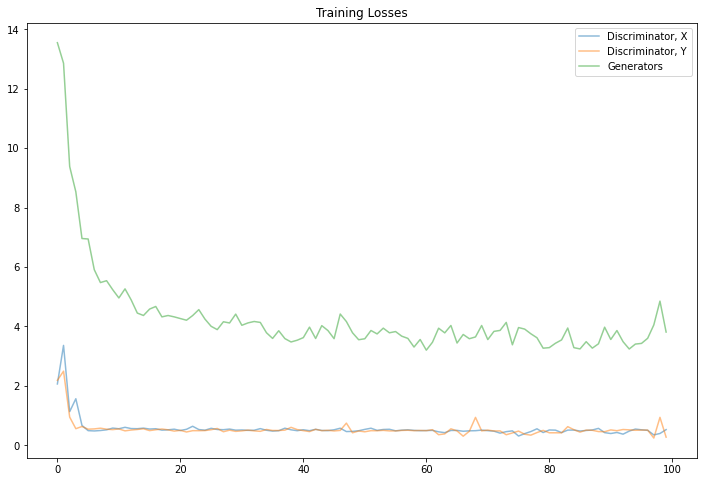

In [27]:
fig, ax = plt.subplots(figsize=(12,8))
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator, X', alpha=0.5)
plt.plot(losses.T[1], label='Discriminator, Y', alpha=0.5)
plt.plot(losses.T[2], label='Generators', alpha=0.5)
plt.title("Training Losses")
plt.legend()

In [28]:
import matplotlib.image as mpimg

# helper visualization code
def view_samples(iteration, sample_dir='samples_cyclegan'):
    
    # samples are named by iteration
    path_XtoY = os.path.join(sample_dir, 'sample-{:06d}-X-Y.png'.format(iteration))
    path_YtoX = os.path.join(sample_dir, 'sample-{:06d}-Y-X.png'.format(iteration))
    
    # read in those samples 
    x2y = mpimg.imread(path_XtoY)
    y2x = mpimg.imread(path_YtoX)
    
    fig, (ax1, ax2) = plt.subplots(figsize=(18,20), nrows=2, ncols=1, sharey=True, sharex=True)
    ax1.imshow(x2y)
    ax1.set_title('X to Y')
    ax2.imshow(y2x)
    ax2.set_title('Y to X')

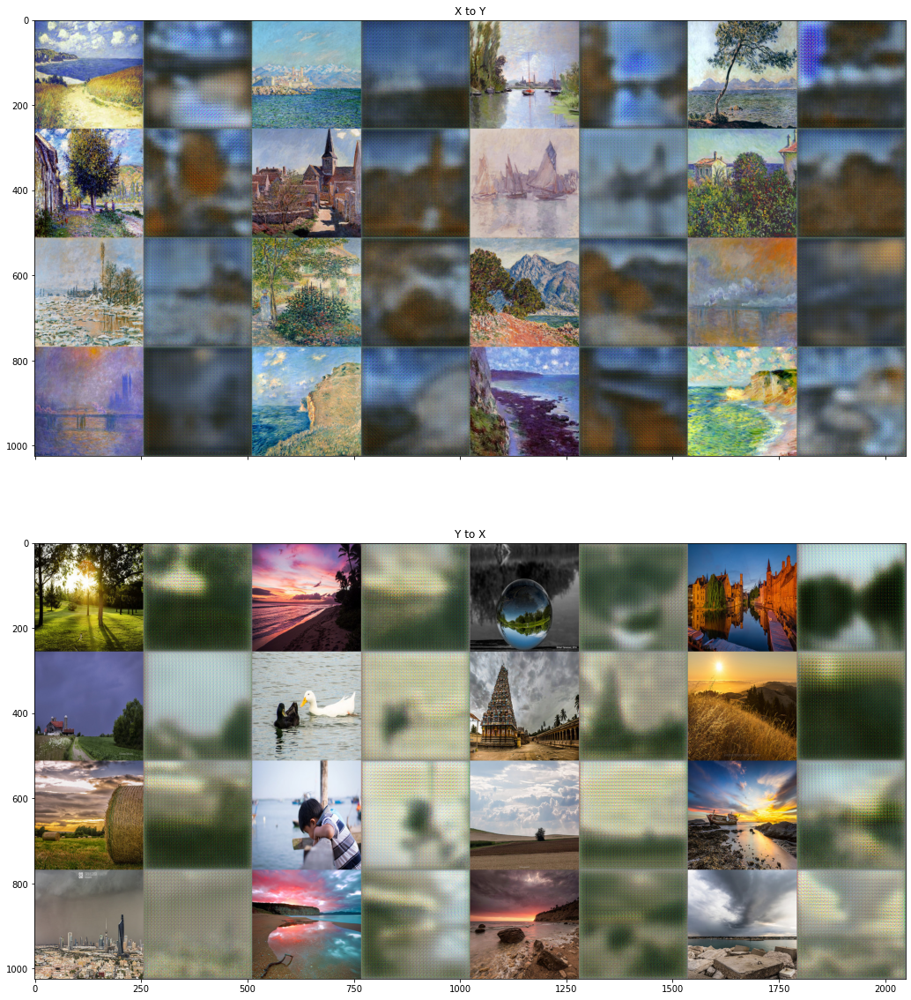

In [29]:
# view samples at iteration 100
view_samples(100, 'samples_cyclegan')

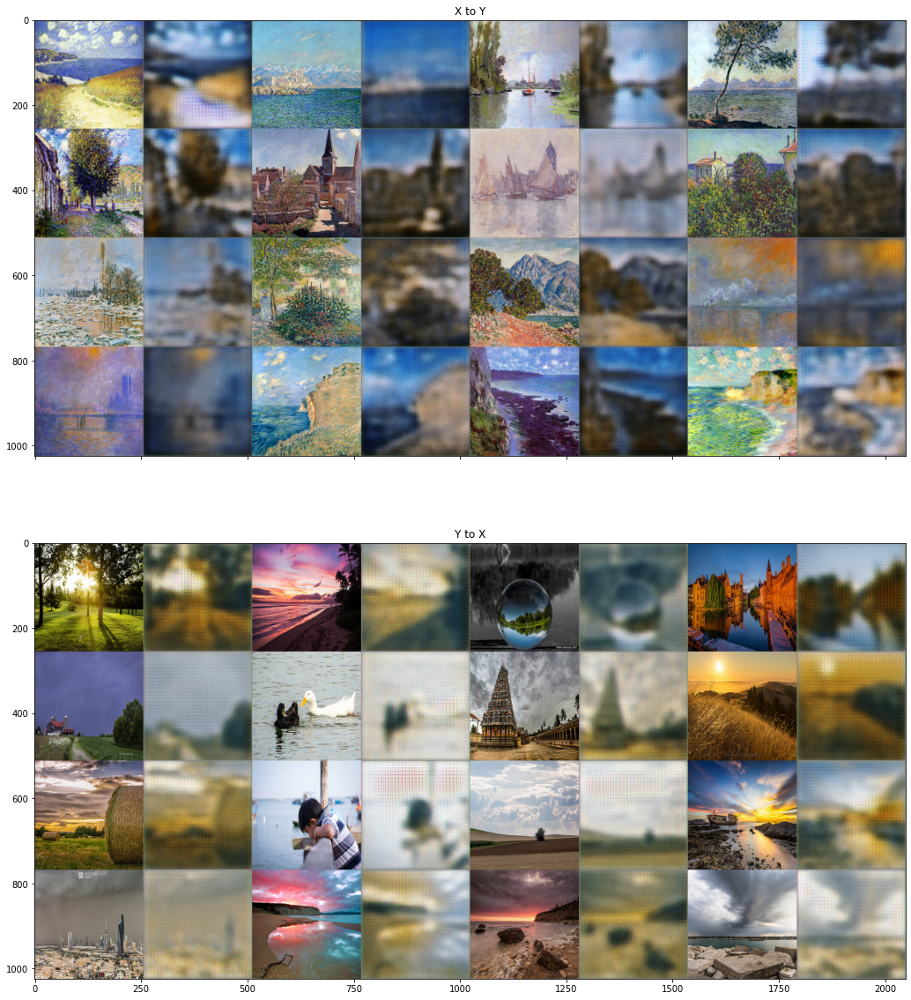

In [30]:
# view samples at iteration 200
view_samples(200, 'samples_cyclegan')

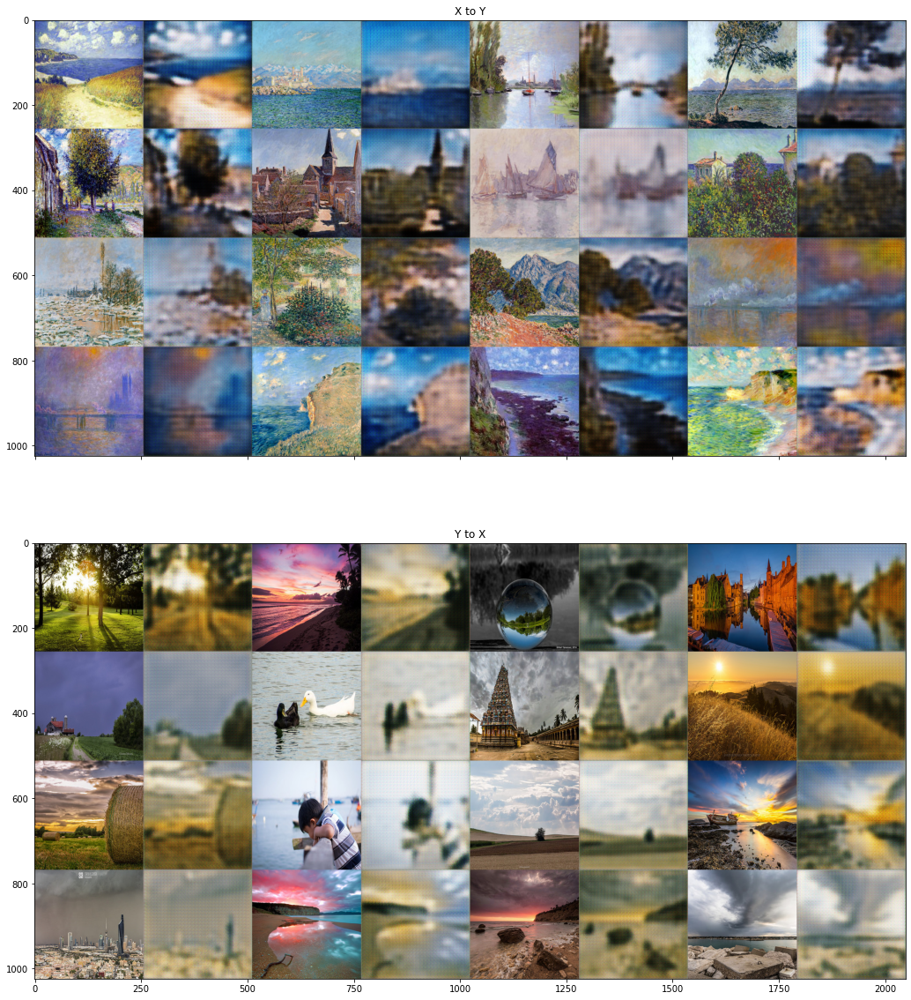

In [31]:
# view samples at iteration 400
view_samples(400, 'samples_cyclegan')

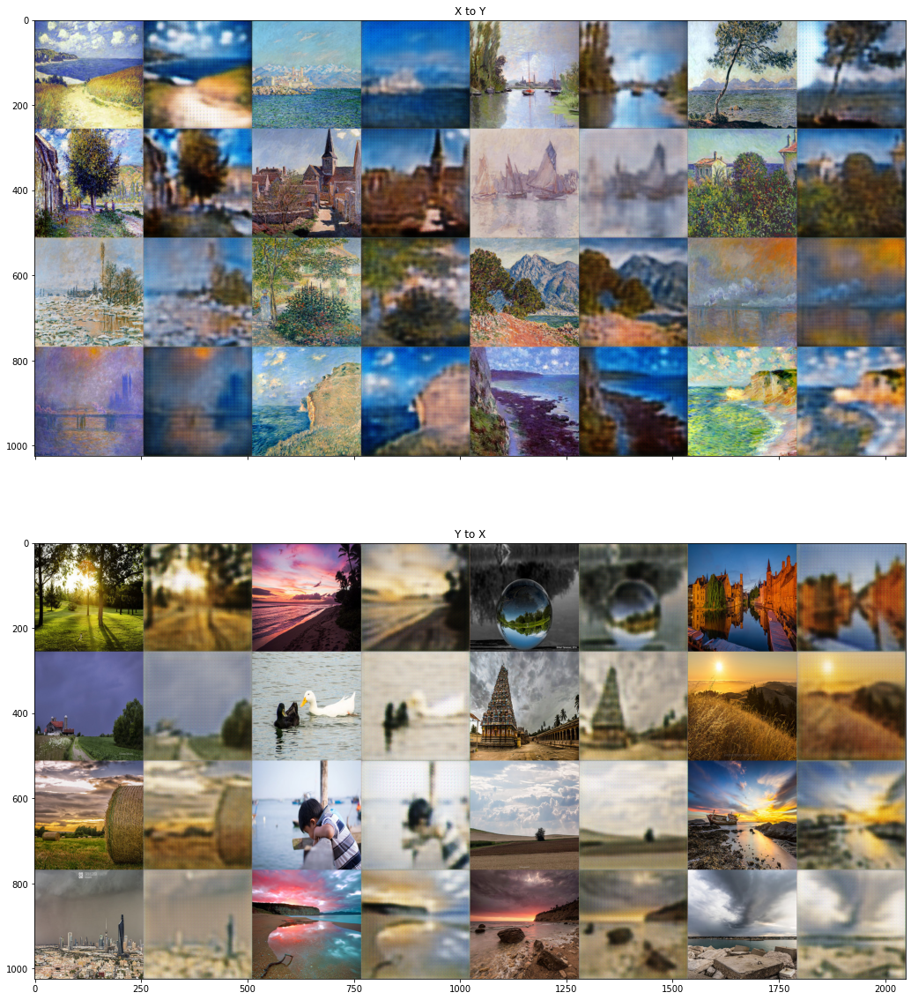

In [32]:
# view samples at iteration 600
view_samples(600, 'samples_cyclegan')

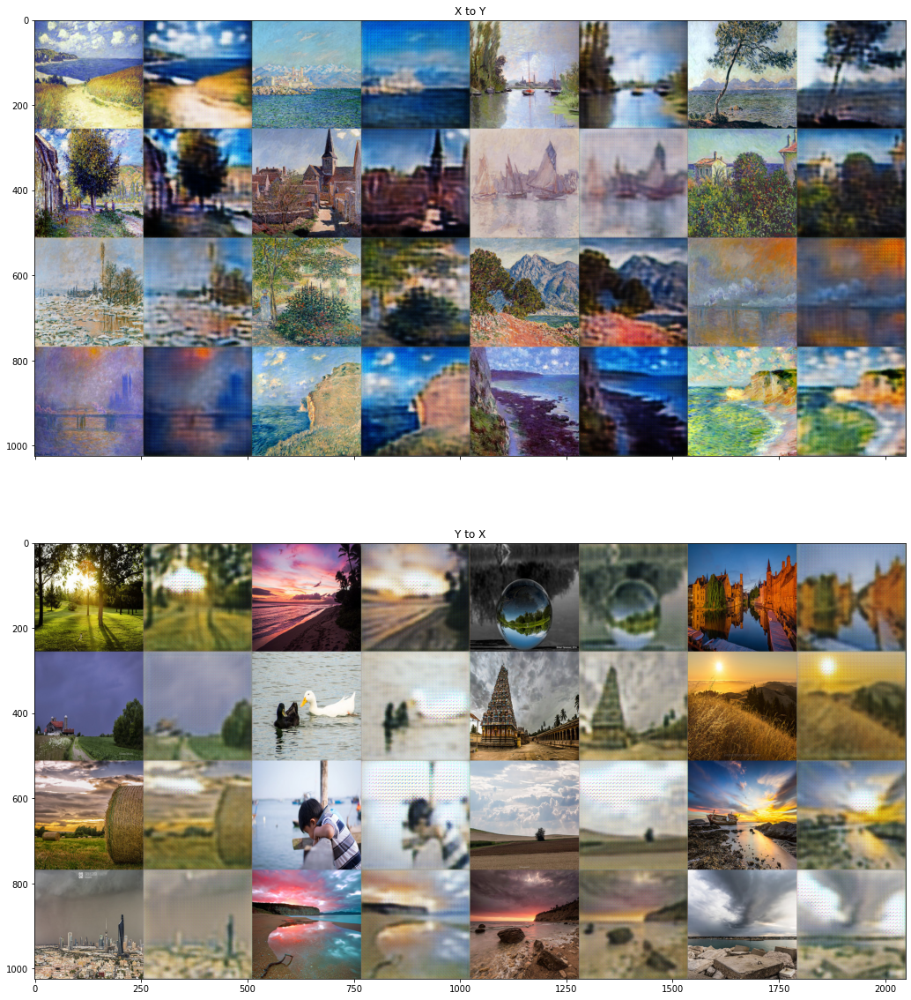

In [34]:
# view samples at iteration 800
view_samples(800, 'samples_cyclegan')

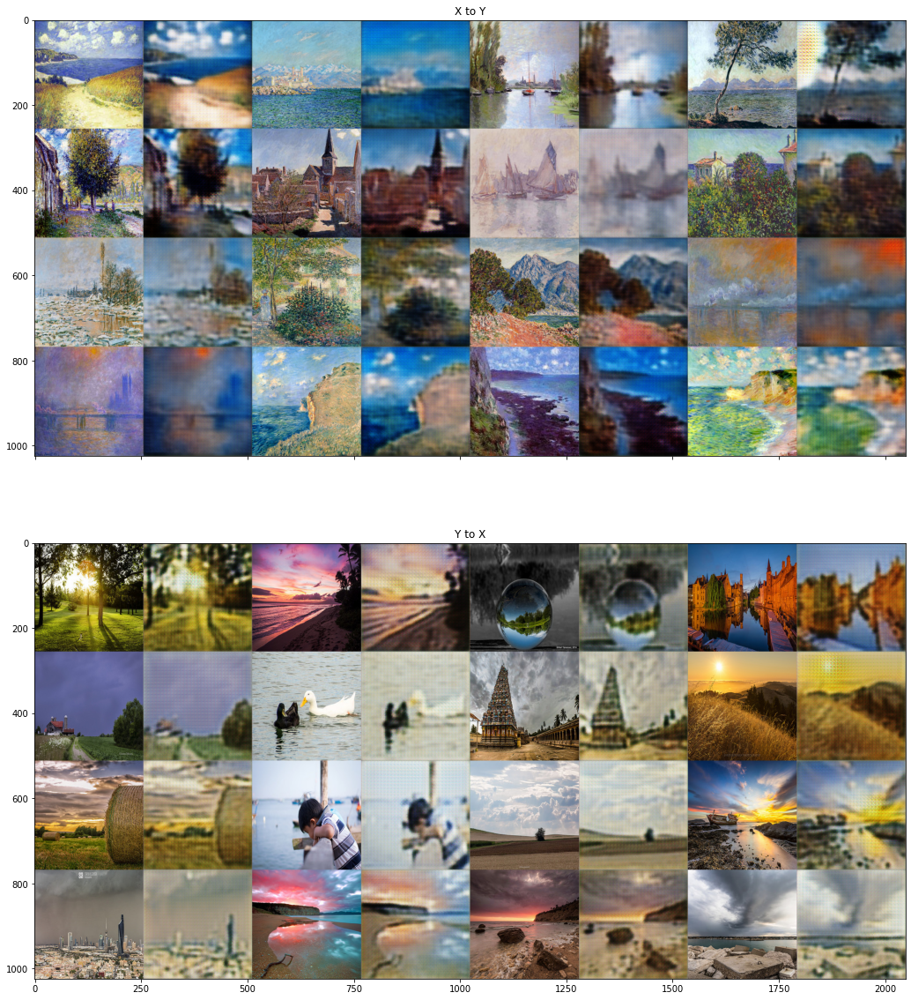

In [35]:
# view samples at iteration 1000
view_samples(1000, 'samples_cyclegan')